In [1]:
!pip install catalyst albumentations==1.0.0 opencv-python-headless==4.1.2.30

     |████████████████████████████████| 446 kB 8.9 MB/s 
     |████████████████████████████████| 98 kB 7.1 MB/s 
     |████████████████████████████████| 21.8 MB 1.3 MB/s 
     |████████████████████████████████| 106 kB 61.3 MB/s 
     |████████████████████████████████| 125 kB 75.6 MB/s 
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [2]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

import torch
from torch import nn
from torch import optim
from torch.utils.data import DataLoader
from torchvision import models
from torchsummary import summary

from pathlib import Path
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import random
import os

plt.style.use('ggplot')

In [3]:
!gdown 153EBxXS4aJ-5qS_emtmzlKUPEhCCZ8ox
!unzip -q butterfly-images40-species.zip

# если подключили гугл диск
# from google.colab import drive
# drive.mount('/content/drive')
# !unzip -q /content/drive/MyDrive/butterfly-images40-species.zip

Downloading...
From: https://drive.google.com/uc?id=153EBxXS4aJ-5qS_emtmzlKUPEhCCZ8ox
To: /content/butterfly-images40-species.zip
100% 382M/382M [00:06<00:00, 60.6MB/s]


In [ ]:
# from torchvision.datasets import ImageFolder
# demo_ds = ImageFolder('train')

## Data preparation

In [4]:
def get_filenames_labels(path):
    filenames = list(Path(path).glob('*/*.jpg'))
    labels = [path.parent.name for path in filenames]
    return filenames, labels

In [5]:
class Dataset:
    classes = os.listdir('train')

    def __init__(self, filenames, labels, mode='train'):
        assert mode in self.transforms, f'Invalid mode, available: {self.transforms.keys()}'
        self.filenames = filenames
        self.labels = [self.classes.index(label) for label in labels]
        
        # Более эффективный метод
        # self.cls2id = dict(zip(self.classes, range(len(self.classes))))
        # self.labels = [self.cls2id[i] for i in labels]
        
        self.mode = mode
        self.transform = self.transforms[mode]

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        label = self.labels[idx]
        img = plt.imread(filename)
        img = self.transform(image=img)['image']
        return img, label


    def __len__(self):
        return len(self.filenames)

    SIZE = 224

    aug_transforms =  A.Compose([    
        A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=(-30, 30)),
        A.RandomResizedCrop(SIZE,SIZE,scale=(0.65, 1.35), ratio=(0.9, 1.1)),
        A.ColorJitter(hue=0.05, saturation=0.2, brightness=0.2, contrast=0.2, p=1),
        A.HorizontalFlip(),
    ])

    train_transforms = A.Compose([
        aug_transforms,
        A.Resize(SIZE, SIZE),
        A.Normalize(),
        ToTensorV2()
    ])

    val_transforms = A.Compose([
        A.Resize(SIZE, SIZE),
        A.Normalize(),
        ToTensorV2()
    ])

    transforms = {
        'demo': aug_transforms,
        'train': train_transforms,
        'val': val_transforms,
        'test': val_transforms
    }

In [ ]:
demo_ds = Dataset(*get_filenames_labels('train'), mode='demo')

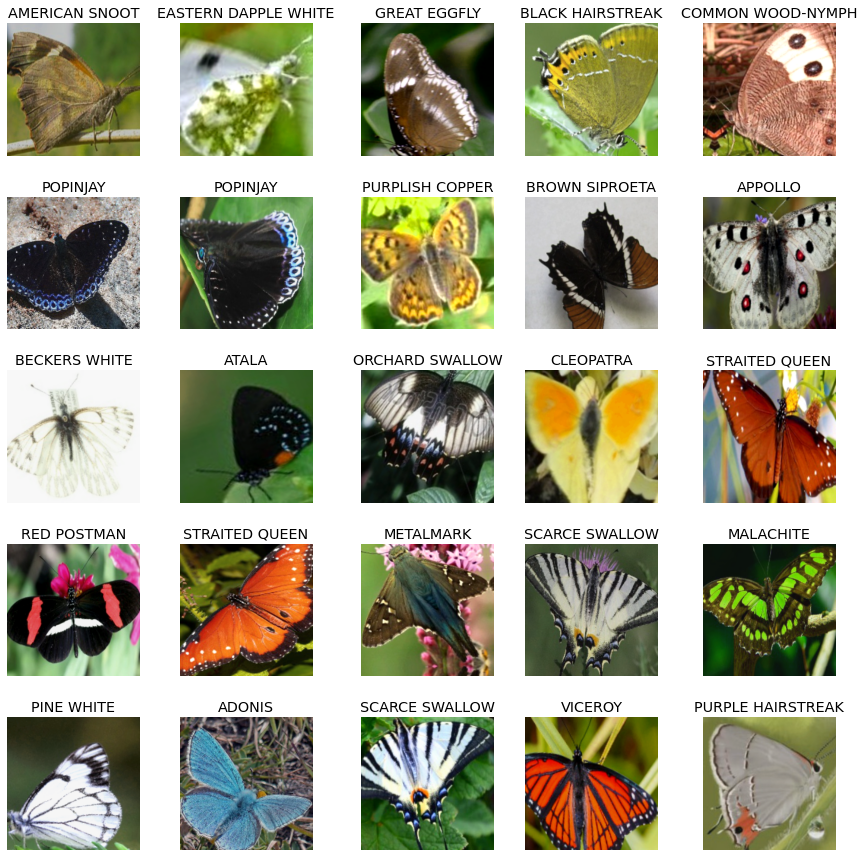

In [ ]:
def show_ds(demo_ds, n=5):
    _, axs = plt.subplots(n, n, figsize=(12,12), constrained_layout=True)
    for i, ax in enumerate(axs.ravel()):
        img, label = random.choice(demo_ds)
        # img, label = demo_ds[i]
        cls = Dataset.classes[label]
        ax.imshow(img)
        ax.set_title(cls)
        ax.grid(False)
        ax.axis('off')
    plt.show()

show_ds(demo_ds)

In [6]:
def make_loader(*data_args, mode=None, bs=1, nw=0, **data_kwargs):
    assert isinstance(mode, str), '`mode` should be string'
    is_train = mode == 'train'
    dataset = Dataset(
        *data_args,
        mode=mode,
        **data_kwargs,
    )
    dataloader = DataLoader(
        dataset,
        batch_size=bs,
        drop_last=is_train,
        shuffle=is_train,
        num_workers=nw
    )
    return dataset, dataloader

In [7]:
train_ds, train_dl = make_loader(*get_filenames_labels('train'), mode='train', bs=32, nw=2)
val_ds, val_dl = make_loader(*get_filenames_labels('valid'), mode='val', bs=32, nw=2)
test_ds, test_dl = make_loader(*get_filenames_labels('test'), mode='test', bs=32, nw=2)

In [ ]:
len(train_ds), len(train_dl)

(9285, 145)

## Import model

[Зоопарк моделей](https://pytorch.org/vision/stable/models.html)

In [ ]:
model = models.AlexNet(num_classes=len(Dataset.classes))
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=3e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)

In [ ]:
summary(model, (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
model.cuda();

In [ ]:
!nvidia-smi

Thu May 19 16:40:23 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P0    26W /  70W |   1478MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Train model

In [ ]:
LOG_DIR = 'logs_alexnet'

In [ ]:
from catalyst import dl, utils

loaders = {
    "train": train_dl,
    "valid": val_dl,
    'infer': test_dl
}

runner = dl.SupervisedRunner(
    input_key="features", output_key="logits", target_key="targets", loss_key="loss"
)

runner.train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    loaders=loaders,
    num_epochs=40,
    callbacks=[
        dl.AccuracyCallback(input_key="logits", target_key="targets", topk=(1, 3, 5)),
        dl.PrecisionRecallF1SupportCallback(input_key="logits", target_key="targets"),
    ],
    logdir=LOG_DIR,
    valid_loader="valid",
    valid_metric="accuracy01",
    minimize_valid_metric=False,
    verbose=True,
    load_best_on_end=True,
    # check=True
    # fp16=True
    # resume=f'{LOG_DIR}/checkpoints/model.best.pth',
)

1/40 * Epoch (train):   0%|          | 0/145 [00:00<?, ?it/s]

train (1/40) accuracy01: 0.9175646551724138 | accuracy01/std: 0.0364954061255944 | accuracy03: 0.9768318965517244 | accuracy03/std: 0.019859086401653507 | accuracy05: 0.9872844827586207 | accuracy05/std: 0.014094499494304896 | f1/_macro: 0.917077489668477 | f1/_micro: 0.9175596551996597 | f1/_weighted: 0.9177382331517134 | loss: 0.2855819273611594 | loss/mean: 0.2855819273611594 | loss/std: 0.11555712532416765 | lr: 7.5e-05 | momentum: 0.9 | precision/_macro: 0.9180199125604748 | precision/_micro: 0.9175646551724138 | precision/_weighted: 0.91860608971956 | recall/_macro: 0.9168548566692307 | recall/_micro: 0.9175646551724138 | recall/_weighted: 0.9175646551724138


1/40 * Epoch (valid):   0%|          | 0/6 [00:00<?, ?it/s]

valid (1/40) accuracy01: 0.738666662534078 | accuracy01/std: 0.056344646047617665 | accuracy03: 0.8960000003178915 | accuracy03/std: 0.011978042004791857 | accuracy05: 0.94399999888738 | accuracy05/std: 0.011578188328931758 | f1/_macro: 0.7234677426501475 | f1/_micro: 0.7386616667005111 | f1/_weighted: 0.7234677426501477 | loss: 1.1714411538441976 | loss/mean: 1.1714411538441976 | loss/std: 0.3026296958173229 | lr: 7.5e-05 | momentum: 0.9 | precision/_macro: 0.7539947089947089 | precision/_micro: 0.7386666666666667 | precision/_weighted: 0.753994708994709 | recall/_macro: 0.7386666666666667 | recall/_micro: 0.7386666666666667 | recall/_weighted: 0.7386666666666667


1/40 * Epoch (infer):   0%|          | 0/6 [00:00<?, ?it/s]

infer (1/40) accuracy01: 0.7253333317438762 | accuracy01/std: 0.061268579243050125 | accuracy03: 0.8986666593551637 | accuracy03/std: 0.03178059254492998 | accuracy05: 0.93599999888738 | accuracy05/std: 0.032426855400961456 | f1/_macro: 0.7089188592378218 | f1/_micro: 0.7253283333678 | f1/_weighted: 0.7089188592378217 | loss: 1.1749592396418254 | loss/mean: 1.1749592396418254 | loss/std: 0.2936689511913755 | lr: 7.5e-05 | momentum: 0.9 | precision/_macro: 0.7271534391534391 | precision/_micro: 0.7253333333333334 | precision/_weighted: 0.7271534391534391 | recall/_macro: 0.7253333333333333 | recall/_micro: 0.7253333333333334 | recall/_weighted: 0.7253333333333334
* Epoch (1/40) lr: 7.5e-05 | momentum: 0.9


2/40 * Epoch (train):   0%|          | 0/145 [00:00<?, ?it/s]

train (2/40) accuracy01: 0.8909482758620687 | accuracy01/std: 0.06021090852119853 | accuracy03: 0.9662715517241379 | accuracy03/std: 0.02905565579548496 | accuracy05: 0.9826508620689653 | accuracy05/std: 0.017421212086843618 | f1/_macro: 0.8904459051361814 | f1/_micro: 0.8909432758901288 | f1/_weighted: 0.8908728222126747 | loss: 0.3711334068199683 | loss/mean: 0.3711334068199683 | loss/std: 0.19276322331087264 | lr: 7.5e-05 | momentum: 0.9 | precision/_macro: 0.8909217758449336 | precision/_micro: 0.8909482758620689 | precision/_weighted: 0.8913270740433845 | recall/_macro: 0.8905231314690222 | recall/_micro: 0.8909482758620689 | recall/_weighted: 0.8909482758620689


2/40 * Epoch (valid):   0%|          | 0/6 [00:00<?, ?it/s]

valid (2/40) accuracy01: 0.7493333317438762 | accuracy01/std: 0.05463321404439625 | accuracy03: 0.9146666593551636 | accuracy03/std: 0.03648098014135316 | accuracy05: 0.9439999926884969 | accuracy05/std: 0.027691201262625132 | f1/_macro: 0.7384923761863249 | f1/_micro: 0.7493283333666961 | f1/_weighted: 0.7384923761863251 | loss: 0.9913189808527628 | loss/mean: 0.9913189808527628 | loss/std: 0.19703577069287756 | lr: 7.5e-05 | momentum: 0.9 | precision/_macro: 0.7754867724867726 | precision/_micro: 0.7493333333333334 | precision/_weighted: 0.7754867724867727 | recall/_macro: 0.7493333333333333 | recall/_micro: 0.7493333333333334 | recall/_weighted: 0.7493333333333335


2/40 * Epoch (infer):   0%|          | 0/6 [00:00<?, ?it/s]

infer (2/40) accuracy01: 0.7466666661898295 | accuracy01/std: 0.04190097850309362 | accuracy03: 0.8959999952316284 | accuracy03/std: 0.031338048482591134 | accuracy05: 0.9386666630109151 | accuracy05/std: 0.014980873509867878 | f1/_macro: 0.7359905653805661 | f1/_micro: 0.7466616667001484 | f1/_weighted: 0.7359905653805662 | loss: 1.066376417160034 | loss/mean: 1.066376417160034 | loss/std: 0.20565158939538267 | lr: 7.5e-05 | momentum: 0.9 | precision/_macro: 0.7794944684944685 | precision/_micro: 0.7466666666666666 | precision/_weighted: 0.7794944684944687 | recall/_macro: 0.7466666666666666 | recall/_micro: 0.7466666666666666 | recall/_weighted: 0.7466666666666667
* Epoch (2/40) lr: 3.75e-05 | momentum: 0.9


3/40 * Epoch (train):   0%|          | 0/145 [00:00<?, ?it/s]

Keyboard Interrupt


KeyboardInterrupt: ignored

## Show progress

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {LOG_DIR}

## Transfer learning

In [8]:
model = models.efficientnet_b3(pretrained=True)

Downloading: "https://download.pytorch.org/models/efficientnet_b3_rwightman-cf984f9c.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_rwightman-cf984f9c.pth


  0%|          | 0.00/47.2M [00:00<?, ?B/s]

In [9]:
in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, len(Dataset.classes))

# Заменить целый блок
# model.classifier = nn.Sequential(
#     nn.Linear(in_features, 1000),
#     nn.ReLU(),
#     nn.Dropout(0.3),
#     nn.Linear(1000, len(Dataset.classes))
# )

In [ ]:
model.classifier

Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1536, out_features=75, bias=True)
)

Заморозка весов

In [ ]:
for param in model.features.parameters():
    param.requires_grad = False

In [ ]:
summary(model.cuda(), (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 40, 112, 112]           1,080
       BatchNorm2d-2         [-1, 40, 112, 112]              80
              SiLU-3         [-1, 40, 112, 112]               0
            Conv2d-4         [-1, 40, 112, 112]             360
       BatchNorm2d-5         [-1, 40, 112, 112]              80
              SiLU-6         [-1, 40, 112, 112]               0
 AdaptiveAvgPool2d-7             [-1, 40, 1, 1]               0
            Conv2d-8             [-1, 10, 1, 1]             410
              SiLU-9             [-1, 10, 1, 1]               0
           Conv2d-10             [-1, 40, 1, 1]             440
          Sigmoid-11             [-1, 40, 1, 1]               0
SqueezeExcitation-12         [-1, 40, 112, 112]               0
           Conv2d-13         [-1, 24, 112, 112]             960
      BatchNorm2d-14         [-1, 24, 1

In [10]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=3e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)

In [11]:
LOG_DIR = 'logs_effnet_b3_full'

In [12]:
from catalyst import dl, utils

loaders = {
    "train": train_dl,
    "valid": val_dl,
    'infer': test_dl
}

runner = dl.SupervisedRunner(
    input_key="features", output_key="logits", target_key="targets", loss_key="loss"
)

runner.train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    loaders=loaders,
    num_epochs=40,
    callbacks=[
        dl.AccuracyCallback(input_key="logits", target_key="targets", topk=(1, 3, 5)),
        dl.PrecisionRecallF1SupportCallback(input_key="logits", target_key="targets"),
    ],
    logdir=LOG_DIR,
    valid_loader="valid",
    valid_metric="accuracy01",
    minimize_valid_metric=False,
    verbose=True,
    load_best_on_end=True,
    # check=True
    # fp16=True
    # resume='logs_enet/checkpoints/model.best.pth',
)

1/40 * Epoch (train):   0%|          | 0/290 [00:00<?, ?it/s]

train (1/40) accuracy01: 0.7101293103448274 | accuracy01/std: 0.25275939052294505 | accuracy03: 0.840732758620689 | accuracy03/std: 0.24029621167181955 | accuracy05: 0.8770474137931035 | accuracy05/std: 0.22384279879134739 | f1/_macro: 0.7124722068558488 | f1/_micro: 0.7101243103800322 | f1/_weighted: 0.7124863520978693 | loss: 1.3888234457579145 | loss/mean: 1.3888234457579145 | loss/std: 1.2839634845473282 | lr: 0.0003 | momentum: 0.9 | precision/_macro: 0.7305875082756729 | precision/_micro: 0.7101293103448276 | precision/_weighted: 0.7281845647441276 | recall/_macro: 0.7078502709077629 | recall/_micro: 0.7101293103448276 | recall/_weighted: 0.7101293103448275


1/40 * Epoch (valid):   0%|          | 0/12 [00:00<?, ?it/s]

valid (1/40) accuracy01: 0.904000000635783 | accuracy01/std: 0.07526651906935695 | accuracy03: 0.9786666666666667 | accuracy03/std: 0.02337404139321426 | accuracy05: 0.9840000000000001 | accuracy05/std: 0.020291986247835708 | f1/_macro: 0.8987885640877294 | f1/_micro: 0.9039950000276548 | f1/_weighted: 0.8987885640877296 | loss: 0.33503025654951735 | loss/mean: 0.33503025654951735 | loss/std: 0.19997065417100335 | lr: 0.0003 | momentum: 0.9 | precision/_macro: 0.9139417989417992 | precision/_micro: 0.904 | precision/_weighted: 0.913941798941799 | recall/_macro: 0.9039999999999999 | recall/_micro: 0.904 | recall/_weighted: 0.9040000000000001


1/40 * Epoch (infer):   0%|          | 0/12 [00:00<?, ?it/s]

infer (1/40) accuracy01: 0.9013333339691163 | accuracy01/std: 0.061025365562435034 | accuracy03: 0.9733333333333334 | accuracy03/std: 0.02812469053107617 | accuracy05: 0.9813333333333334 | accuracy05/std: 0.027145051711906284 | f1/_macro: 0.8941754636223778 | f1/_micro: 0.9013283333610699 | f1/_weighted: 0.8941754636223779 | loss: 0.7152075208028157 | loss/mean: 0.7152075208028157 | loss/std: 0.8320435882192754 | lr: 0.0003 | momentum: 0.9 | precision/_macro: 0.9050476190476191 | precision/_micro: 0.9013333333333333 | precision/_weighted: 0.9050476190476191 | recall/_macro: 0.9013333333333332 | recall/_micro: 0.9013333333333333 | recall/_weighted: 0.9013333333333334
* Epoch (1/40) lr: 0.0003 | momentum: 0.9


2/40 * Epoch (train):   0%|          | 0/290 [00:00<?, ?it/s]

train (2/40) accuracy01: 0.9255387931034486 | accuracy01/std: 0.04608098134520956 | accuracy03: 0.9864224137931034 | accuracy03/std: 0.020701992424574298 | accuracy05: 0.9929956896551724 | accuracy05/std: 0.01604387583752384 | f1/_macro: 0.9251850371272132 | f1/_micro: 0.9255337931304594 | f1/_weighted: 0.925514179164128 | loss: 0.27151176261490806 | loss/mean: 0.27151176261490806 | loss/std: 0.1405397467525779 | lr: 0.0003 | momentum: 0.9 | precision/_macro: 0.9255664189704169 | precision/_micro: 0.9255387931034482 | precision/_weighted: 0.9257971832870828 | recall/_macro: 0.9251120131574669 | recall/_micro: 0.9255387931034482 | recall/_weighted: 0.9255387931034483


2/40 * Epoch (valid):   0%|          | 0/12 [00:00<?, ?it/s]

valid (2/40) accuracy01: 0.960000000635783 | accuracy01/std: 0.0319164291092886 | accuracy03: 0.9973333333333333 | accuracy03/std: 0.008742197947623745 | accuracy05: 0.9973333333333333 | accuracy05/std: 0.008742197947623745 | f1/_macro: 0.9594024225475405 | f1/_micro: 0.9599950000260415 | f1/_weighted: 0.9594024225475405 | loss: 0.17751134161154428 | loss/mean: 0.17751134161154428 | loss/std: 0.11525581604163737 | lr: 0.0003 | momentum: 0.9 | precision/_macro: 0.964222222222222 | precision/_micro: 0.96 | precision/_weighted: 0.9642222222222222 | recall/_macro: 0.96 | recall/_micro: 0.96 | recall/_weighted: 0.9600000000000001


2/40 * Epoch (infer):   0%|          | 0/12 [00:00<?, ?it/s]

infer (2/40) accuracy01: 0.9386666666666666 | accuracy01/std: 0.04273670582713924 | accuracy03: 0.984 | accuracy03/std: 0.024059862953632834 | accuracy05: 0.9946666666666667 | accuracy05/std: 0.017484395895247473 | f1/_macro: 0.9363111074177811 | f1/_micro: 0.9386616666933 | f1/_weighted: 0.936311107417781 | loss: 0.22031406881908575 | loss/mean: 0.22031406881908575 | loss/std: 0.14826366977823735 | lr: 0.0003 | momentum: 0.9 | precision/_macro: 0.9506507936507934 | precision/_micro: 0.9386666666666666 | precision/_weighted: 0.9506507936507937 | recall/_macro: 0.9386666666666668 | recall/_micro: 0.9386666666666666 | recall/_weighted: 0.9386666666666668
* Epoch (2/40) lr: 0.0003 | momentum: 0.9


3/40 * Epoch (train):   0%|          | 0/290 [00:00<?, ?it/s]

Keyboard Interrupt


KeyboardInterrupt: ignored

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {LOG_DIR}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## Save/load model

load model

In [14]:
model = models.efficientnet_b3()
in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, len(Dataset.classes))

state_dict = torch.load(f'{LOG_DIR}/checkpoints/model.best.pth')
model.load_state_dict(state_dict)

<All keys matched successfully>

save model

In [ ]:
torch.save(model.state_dict(), 'model.pth')

## ONNX

Сохранение модели в формате ONNX

In [15]:
dummy_input = torch.randn(1, 3, Dataset.SIZE, Dataset.SIZE)
input_names = ["input1"]
output_names = ["output1"]
torch.onnx.export(model.cpu(), dummy_input, "butterfly.onnx", verbose=True, input_names=input_names, output_names=output_names)

graph(%input1 : Float(1, 3, 224, 224, strides=[150528, 50176, 224, 1], requires_grad=0, device=cpu),
      %features.1.0.block.1.fc1.weight : Float(10, 40, 1, 1, strides=[40, 1, 1, 1], requires_grad=1, device=cpu),
      %features.1.0.block.1.fc1.bias : Float(10, strides=[1], requires_grad=1, device=cpu),
      %features.1.0.block.1.fc2.weight : Float(40, 10, 1, 1, strides=[10, 1, 1, 1], requires_grad=1, device=cpu),
      %features.1.0.block.1.fc2.bias : Float(40, strides=[1], requires_grad=1, device=cpu),
      %features.1.1.block.1.fc1.weight : Float(6, 24, 1, 1, strides=[24, 1, 1, 1], requires_grad=1, device=cpu),
      %features.1.1.block.1.fc1.bias : Float(6, strides=[1], requires_grad=1, device=cpu),
      %features.1.1.block.1.fc2.weight : Float(24, 6, 1, 1, strides=[6, 1, 1, 1], requires_grad=1, device=cpu),
      %features.1.1.block.1.fc2.bias : Float(24, strides=[1], requires_grad=1, device=cpu),
      %features.2.0.block.2.fc1.weight : Float(6, 144, 1, 1, strides=[144, 1, 1

Запуск модели в формате ONNX

In [13]:
!pip install onnxruntime

     |████████████████████████████████| 5.2 MB 32.6 MB/s 


In [16]:
import onnxruntime as ort
import numpy as np

ort_session = ort.InferenceSession("butterfly.onnx")

outputs = ort_session.run(
    [ort_session.get_outputs()[0].name],
    {ort_session.get_inputs()[0].name: np.random.randn(1, 3, 224, 224).astype(np.float32)},
        )[0]
outputs[0]

array([1.7958995, 1.4880757, 1.5129906, 1.4443848, 1.0836432, 1.4853982,
       1.6925534, 1.5979047, 1.5592093, 1.2646067, 1.7473583, 1.5134857,
       1.7591449, 1.7596669, 1.8773283, 1.6784223, 1.4840915, 1.4671527,
       1.7784431, 1.5986172, 1.692577 , 2.1044765, 1.5292311, 1.2911026,
       1.4416851, 1.7176802, 2.0872583, 1.7770803, 1.5639088, 1.496583 ,
       1.6739216, 1.6446733, 1.4458847, 1.8213999, 1.8705298, 1.3241061,
       1.557987 , 1.9115442, 1.9733386, 1.4250947, 1.7724627, 1.6556256,
       1.377785 , 2.0242093, 1.5860412, 1.4765055, 1.698591 , 1.6440392,
       1.3170204, 1.762984 , 1.5489595, 1.5862144, 1.7218348, 2.1921868,
       1.9162195, 1.6723922, 1.8024168, 1.6867176, 1.2098963, 1.6538653,
       1.9497808, 1.3499763, 1.8610442, 1.9407446, 1.7710099, 1.6679637,
       1.2818005, 2.1158242, 1.6579509, 1.9507142, 1.7707052, 1.6631947,
       1.5218693, 1.6341517, 1.5374389], dtype=float32)

In [20]:
from scipy.special import softmax
softmax(outputs[0])

array([0.01501616, 0.01103755, 0.011316  , 0.01056569, 0.00736597,
       0.01100804, 0.0135418 , 0.01231887, 0.01185129, 0.00882717,
       0.01430467, 0.01132161, 0.01447426, 0.01448182, 0.01629007,
       0.01335178, 0.01099367, 0.01080901, 0.01475631, 0.01232765,
       0.01354211, 0.0204443 , 0.01150128, 0.00906418, 0.01053721,
       0.01388637, 0.0200953 , 0.01473621, 0.01190711, 0.01113185,
       0.01329182, 0.01290869, 0.01058155, 0.015404  , 0.0161797 ,
       0.00936832, 0.01183682, 0.0168571 , 0.01793163, 0.01036383,
       0.01466832, 0.01305084, 0.00988494, 0.01886742, 0.01217359,
       0.01091058, 0.0136238 , 0.01290051, 0.00930217, 0.01452995,
       0.01173044, 0.0121757 , 0.01394418, 0.02231846, 0.0169361 ,
       0.01327151, 0.01511434, 0.013463  , 0.0083572 , 0.0130279 ,
       0.01751414, 0.00961384, 0.01602695, 0.01735658, 0.01464703,
       0.01321287, 0.00898025, 0.02067761, 0.01308123, 0.01753049,
       0.01464257, 0.01315   , 0.01141692, 0.01277358, 0.01159

Проверка работоспособности

In [21]:
onnx_transforms = A.Compose([
    A.Resize(224, 224),
    A.Normalize(),
])

def preprocess_img(img):
    img = onnx_transforms(image=img)['image']
    # H x W x C
    img = np.transpose(img, (2, 0, 1))
    # C x H x W
    img = img[None]
    # 1 x C x H x W
    return img

def run_model(ort_session, inputs):
    return ort_session.run(
    [ort_session.get_outputs()[0].name],
    {ort_session.get_inputs()[0].name: inputs},
        )[0][0]


def evaluate(ort_session):
    true = cnt = 0
    for impath in tqdm(list(Path('test').glob('*/*.jpg'))):
        label = impath.parent.name
        img = plt.imread(impath)
        img = preprocess_img(img)
        pred_cls = run_model(ort_session, img).argmax()
        if label == Dataset.classes[pred_cls]:
            true += 1
        cnt += 1
    return true / cnt

In [22]:
print('Accuracy:', evaluate(ort_session))

  0%|          | 0/375 [00:00<?, ?it/s]

Accuracy: 0.9386666666666666


Сохраняем модель на диск

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!mv butterfly.onnx /content/drive/MyDrive

In [ ]:
print(Dataset.classes)

['CABBAGE WHITE', 'CRECENT', 'ORANGE OAKLEAF', 'PURPLISH COPPER', 'COPPER TAIL', 'TWO BARRED FLASHER', 'RED POSTMAN', 'PEACOCK', 'ORCHARD SWALLOW', 'PURPLE HAIRSTREAK', 'MALACHITE', 'BROWN SIPROETA', 'APPOLLO', 'INDRA SWALLOW', 'GREY HAIRSTREAK', 'RED SPOTTED PURPLE', 'CHECQUERED SKIPPER', 'CRIMSON PATCH', 'PIPEVINE SWALLOW', 'CLODIUS PARNASSIAN', 'AMERICAN SNOOT', 'MONARCH', 'METALMARK', 'BANDED PEACOCK', 'GREEN CELLED CATTLEHEART', 'MOURNING CLOAK', 'AN 88', 'GREAT EGGFLY', 'SLEEPY ORANGE', 'RED ADMIRAL', 'MANGROVE SKIPPER', 'POPINJAY', 'SOUTHERN DOGFACE', 'AFRICAN GIANT SWALLOWTAIL', 'LARGE MARBLE', 'MILBERTS TORTOISESHELL', 'ATALA', 'SILVER SPOT SKIPPER', 'CLEOPATRA', 'SOOTYWING', 'COMMON BANDED AWL', 'WOOD SATYR', 'DANAID EGGFLY', 'ZEBRA LONG WING', 'BANDED ORANGE HELICONIAN', 'BLUE MORPHO', 'PINE WHITE', 'CAIRNS BIRDWING', 'BLACK HAIRSTREAK', 'STRAITED QUEEN', 'ORANGE TIP', 'EASTERN PINE ELFIN', 'EASTERN DAPPLE WHITE', 'VICEROY', 'ULYSES', 'IPHICLUS SISTER', 'JULIA', 'CHESTNUT', 